# "EarthAnnotator"

## Prototype web-based image labeling tool

Daniel Buscombe, daniel.buscombe@nau.edu

October 2018

Implements the technique outlined by [Buscombe & Ritchie (2018)](https://www.mdpi.com/2076-3263/8/7/244)

### 1. Load libraries

In [1]:
from PIL import Image ##from imageio import imread
import numpy as np
import matplotlib.pyplot as plt
import holoviews as hv
from holoviews.streams import PointDraw, PolyEdit, BoxEdit, PolyDraw, FreehandDraw

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
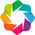

In [2]:
hv.extension('bokeh')

In [3]:
from funcs.crf_utils import *
from funcs.widgets_utils import *
from funcs.file_select import FileBrowser
from funcs.tile_utils import sliding_window
global labels_widget

### 2. Pick an image 

In [4]:
# NBVAL_IGNORE_OUTPUT
file_picker = FileBrowser()
file_picker.widget()

In [5]:
imfile = 'data/NewRiver_worldImageryRGB_20m.tif'

In [6]:
im = Image.open(imfile)
im = im.convert("RGB")
nx, ny, nz = np.shape(im)

### 3. Make labels and colors

#### Instructions:
1. Create class labels and assign each label a color

In [7]:
# NBVAL_IGNORE_OUTPUT
label_editor, labels_widget = create_colorpicker()
label_editor

In [8]:
labels, colors = get_labels_and_colors(label_editor)

In [9]:
anno = {}

In [10]:
# NBVAL_IGNORE_OUTPUT

labellist = widgets.Dropdown(
    options=labels,
    value=labels[0],
    description='Label:',
    disabled=False,
)
labellist

Dropdown(description='Label:', options=('class1', 'class2', 'class3'), value='class1')

### 4. Freehand Drawing

#### Instructions:
1. Choose a label from the above dropdown menu, and execute the next three cells
2. When labeling, use the 'pen' tool
3. Repeat for all labels

In [11]:
k = labels.index(callback(labellist))
brush=5 #don't change once set

In [12]:
%%opts Path (line_width=brush color=colors[k])[width=ny, height=nx] 
print("Annotate: %s" % labels[k])
path = hv.Path([[(0, 0), (0, 0)]])
freehand_stream = FreehandDraw(source=path, num_objects=999)
bounds=(0,0,ny,nx)   # Coordinate system: (left, bottom, top, right)
img = hv.RGB(np.array(im), bounds=bounds) #hv.Image(im, bounds=bounds)
img * path 

Annotate: class1


:Overlay
   .RGB.I  :RGB   [x,y]   (R,G,B)
   .Path.I :Path   [x,y]

In [13]:
# X, Y = access_annotation_coordinates(freehand_stream)

X, Y = (
    np.array(
        [
            737.17851705, 739.39288977, 741.60726248, 744.37522838,
            745.48241474, 746.5896011 , 748.80397381, 749.91116017,
            750.46475335, 751.01834653, 751.57193971, 752.12553289,
            753.23271924, 753.23271924, 752.67912607, 751.57193971,
            749.91116017, 748.80397381, 747.69678745, 746.5896011 ,
            745.48241474, 744.37522838, 743.8216352 , 742.71444884,
            742.16085566, 742.16085566, 742.16085566, 742.16085566
        ]
    ),
    np.array(
        [
            898.24505652, 887.91009915, 887.91009915, 886.35985555,
            886.35985555, 885.84310768, 884.80961194, 883.77611621,
            883.77611621, 883.77611621, 883.77611621, 883.77611621,
            884.29286408, 884.80961194, 886.87660342, 888.42684702,
            889.46034276, 890.4938385 , 892.0440821 , 892.0440821 ,
            892.56082997, 893.59432571, 894.11107358, 895.14456931,
            895.14456931, 895.14456931, 895.14456931, 895.14456931
        ]
    )
)

In [14]:
anno[callback(labellist)] = np.column_stack((X,Y))
print(anno.keys())

dict_keys(['class1'])


### 5. Choose parameters and run pixel estimation model

In [15]:
# This parameter penalizes small pieces of segmentation that are
# spatially isolated -- enforces more spatially consistent segmentations
compat_spat=12 ##non-dimensional
# larger values = larger pieces of segmentation allowed

In [16]:
# This parameter penalizes pieces of segmentation that are
# less uniform in color -- enforces more consistent segmentations in colorspace
compat_col=100 ##non-dimensional
# larger values = pieces of segmentation with less similar image intesity allowed

In [17]:
# Scaling parameters: tolerances in intensity and location
theta=60 
# larger values = pixel pairs can be considered to be the same class label with less similar location/intensity

In [18]:
# number of iterations for algorithm (generally, larger the better, but only to a point)
n_iter=15

In [19]:
Lc = get_sparse_label(anno, nx, ny, ['class1'], brush)
res = getCRF(im, Lc, theta, n_iter, labels, compat_spat, compat_col)
out = get_rgb(res, labels, colors)

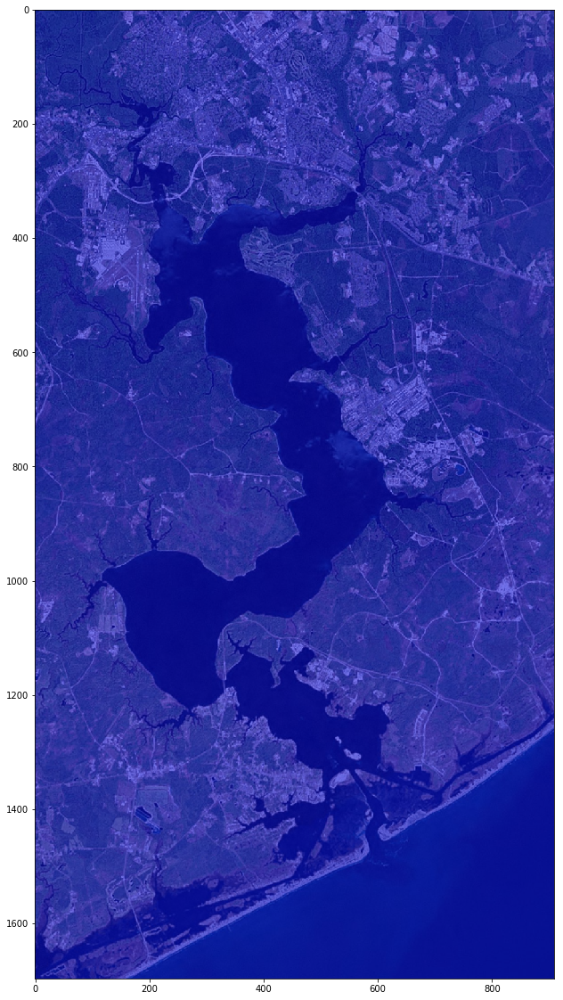

In [20]:
plt.figure(figsize=(20,20))
plt.imshow(im)
plt.imshow(out, alpha=0.5)

### 6. Write image to file

In [21]:
write_label_image(imfile, out)